In [1]:
from ISR.models import RRDN
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import os
merge_path = 'galaxy_zoo/merged_2blend_valid'
individual_path = 'galaxy_zoo/individuals_2blend_valid'
rrdn = RRDN(arch_params={'C':4, 'D':3, 'G':64, 'G0':64,'T':10,'x':1})
rrdn.model.load_weights('real_galaxy/real_galaxy/weights/rrdn-C4-D3-G64-G064-T10-x1/2020-07-27_13-13/rrdn-C4-D3-G64-G064-T10-x1_best-val_generator_PSNR_Y_epoch853.hdf5')

In [2]:
def generate(lr_img):
    
    sr_img = rrdn.predict(lr_img)
    return sr_img

In [3]:
def get_single(file_name):
    id = file_name[-9:-4]
    images = ['single_2_'+id+'_'+str(i)+'.png' for i in [1,2]]
    means = [np.mean(np.array(Image.open(individual_path+'/'+single_image))) for single_image in images]
    file = images[means.index(max(means))]
    return np.array(Image.open(individual_path+'/'+file))

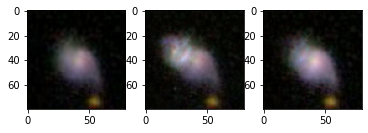

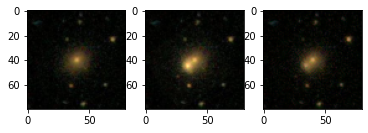

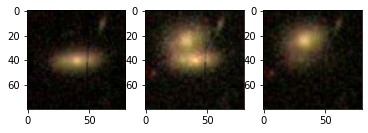

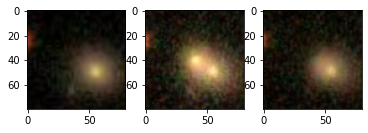

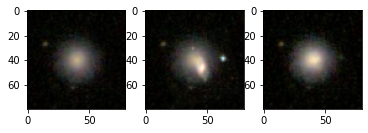

...

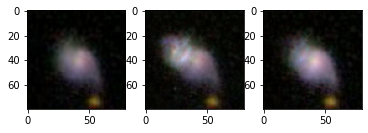

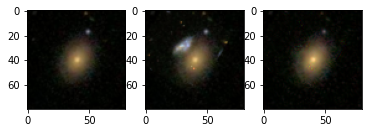

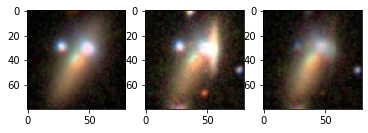

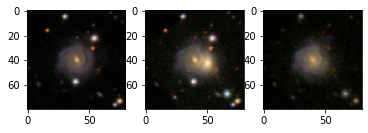

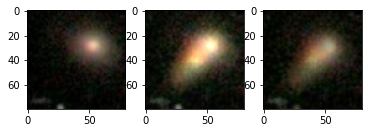

In [6]:
for merged_file in np.random.choice(os.listdir(merge_path),size=300):
    pre_blend = get_single(merged_file)
    merged_image = Image.open(merge_path+'/'+merged_file)
    generated = generate(np.array(merged_image))
    f,ax = plt.subplots(1,3)
    ax[0].imshow(pre_blend)
    ax[1].imshow(merged_image)
    ax[2].imshow(generated)
    plt.show()